# Forecasting Net Prophet

You’re a growth analyst at [MercadoLibre](http://investor.mercadolibre.com/about-us). With over 200 million users, MercadoLibre is the most popular e-commerce site in Latin America. You've been tasked with analyzing the company's financial and user data in clever ways to make the company grow. So, you want to find out if the ability to predict search traffic can translate into the ability to successfully trade the stock.

The instructions for this Challenge are divided into four steps, as follows:

* Step 1: Find unusual patterns in hourly Google search traffic

* Step 2: Mine the search traffic data for seasonality

* Step 3: Relate the search traffic to stock price patterns

* Step 4: Create a time series model with Prophet

The following subsections detail these steps.

## Install and import the required libraries and dependencies

In [75]:
# Install the required libraries
!pip install prophet

'pip' is not recognized as an internal or external command,
operable program or batch file.


In [76]:
# Import the required libraries and dependencies
import pandas as pd
from prophet import Prophet
import datetime as dt
import numpy as np
%matplotlib inline

## Step 1: Find Unusual Patterns in Hourly Google Search Traffic

The data science manager asks if the Google search traffic for the company links to any financial events at the company. Or, does the search traffic data just present random noise? To answer this question, pick out any unusual patterns in the Google search data for the company, and connect them to the corporate financial events.

To do so, complete the following steps:

1. Read the search data into a DataFrame, and then slice the data to just the month of May 2020. (During this month, MercadoLibre released its quarterly financial results.) Visualize the results. Do any unusual patterns exist?

2. Calculate the total search traffic for the month, and then compare the value to the monthly median across all months. Did the Google search traffic increase during the month that MercadoLibre released its financial results?


#### Step 1: Read the search data into a DataFrame, and then slice the data to just the month of May 2020. (During this month, MercadoLibre released its quarterly financial results.) Visualize the results. Do any unusual patterns exist?

In [77]:
# Store the data in a Pandas DataFrame
# Set the "Date" column as the Datetime Index.

df_mercado_trends = pd.read_csv(
    "https://static.bc-edx.com/ai/ail-v-1-0/m8/lms/datasets/google_hourly_search_trends.csv",
    index_col='Date', 
    parse_dates=True, 
    infer_datetime_format=True
).dropna()

# Review the first and last five rows of the DataFrame
display(df_mercado_trends.head())
display(df_mercado_trends.tail())

C:\Users\ismet\AppData\Local\Temp\ipykernel_7620\1096498906.py:4: FutureWarning:

The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.

C:\Users\ismet\AppData\Local\Temp\ipykernel_7620\1096498906.py:4: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



,Search Trends
Date,
2016-06-01 00:00:00,97
2016-06-01 01:00:00,92
2016-06-01 02:00:00,76
2016-06-01 03:00:00,60
2016-06-01 04:00:00,38


,Search Trends
Date,
2020-09-07 20:00:00,71
2020-09-07 21:00:00,83
2020-09-07 22:00:00,96
2020-09-07 23:00:00,97
2020-09-08 00:00:00,96


In [78]:
# Review the data types of the DataFrame using the info function
df_mercado_trends.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 37106 entries, 2016-06-01 00:00:00 to 2020-09-08 00:00:00
Data columns (total 1 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   Search Trends  37106 non-null  int64
dtypes: int64(1)
memory usage: 579.8 KB


                     Search Trends
Date                              
2020-05-01 00:00:00             80
2020-05-01 01:00:00             80
2020-05-01 02:00:00             76
2020-05-01 03:00:00             66
2020-05-01 04:00:00             53
...                            ...
2020-05-31 19:00:00             59
2020-05-31 20:00:00             64
2020-05-31 21:00:00             76
2020-05-31 22:00:00             90
2020-05-31 23:00:00             96

[744 rows x 1 columns]


<Figure size 1000x500 with 0 Axes>

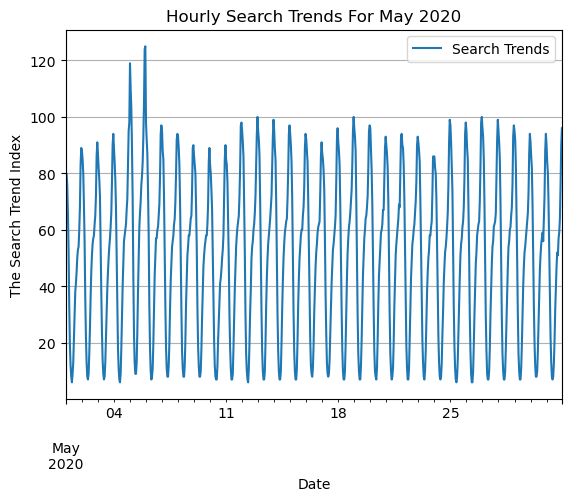

In [84]:
# Slice the DataFrame to just the month of May 2020
may_2020_data = df_mercado_trends.loc['2020-05']
print(may_2020_data)

# Plot to visualize the data for May 2020
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 5))
may_2020_data.plot()
plt.title('Hourly Search Trends For May 2020')
plt.xlabel('Date')
plt.ylabel('The Search Trend Index')
plt.grid(True)
plt.show()


#### Step 2: Calculate the total search traffic for the month, and then compare the value to the monthly median across all months. Did the Google search traffic increase during the month that MercadoLibre released its financial results?

In [80]:
# Calculate the sum of the total search traffic for May 2020
# View the traffic_may_2020 value
total_search_traffic_may_2020 = may_2020_data['Search Trends'].sum()
print(f"Total search traffic for May 2020: {total_search_traffic_may_2020}")


Total search traffic for May 2020: 38181


In [81]:
# Calcluate the monhtly median search traffic across all months 
# Group the DataFrame by index year and then index month, chain the sum and then the median functions
monthly_traffic_sum = df_mercado_trends.groupby([df_mercado_trends.index.year, df_mercado_trends.index.month]).sum()
median_monthly_traffic = monthly_traffic_sum.median()


# View the median_monthly_traffic value
print(f"Median of monthly total search traffic across all months: {median_monthly_traffic}")


Median of monthly total search traffic across all months: Search Trends    35172.5
dtype: float64


In [83]:
# To compare the seach traffic for the month of May 2020 to the overall monthly median value,
# Divide the may traffic total by the median monthly traffic

# Code To Calculate the total traffic for May 2020
may_2020_traffic = df_mercado_trends.loc['2020-05'].sum().sum()  # Adjust if your data has a specific column for traffic

# Code To Group by year and month of the index, then calculate the sum of traffic for each month
monthly_traffic_sum = df_mercado_trends.groupby([df_mercado_trends.index.year, df_mercado_trends.index.month]).sum()

# Code To Calculate the median of the monthly sums of traffic
median_monthly_traffic = monthly_traffic_sum.median().sum()  # Sum is used here to handle DataFrames with multiple columns

# Code To Divide the May 2020 traffic by the median monthly traffic to compare
comparison_ratio = may_2020_traffic / median_monthly_traffic

# Printing the comparison ratio
print(f"Ratio of May 2020 traffic to median monthly traffic: {comparison_ratio}")



Ratio of May 2020 traffic to median monthly traffic: 1.0855355746677091


##### Answer the following question: 

**Question:** Did the Google search traffic increase during the month that MercadoLibre released its financial results?

**Answer:** Yes

## Step 2: Mine the Search Traffic Data for Seasonality

Marketing realizes that they can use the hourly search data, too. If they can track and predict interest in the company and its platform for any time of day, they can focus their marketing efforts around the times that have the most traffic. This will get a greater return on investment (ROI) from their marketing budget.

To that end, you want to mine the search traffic data for predictable seasonal patterns of interest in the company. To do so, complete the following steps:

1. Group the hourly search data to plot the average traffic by the hour of day. Does the search traffic peak at a particular time of day or is it relatively consistent?

2. Group the hourly search data to plot the average traffic by the day of the week (for example, Monday vs. Friday). Does the search traffic get busiest on any particular day of the week?

3. Group the hourly search data to plot the average traffic by the week of the year. Does the search traffic tend to increase during the winter holiday period (weeks 40 through 52)?


#### Step 1: Group the hourly search data to plot the average traffic by the hour of the day.

<Figure size 1500x500 with 0 Axes>

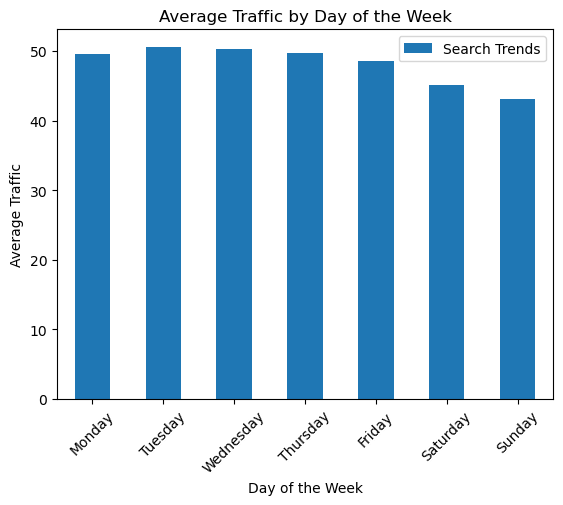

In [87]:
# Group the hourly search data to plot the average traffic by the day of week 

# Code To Extract day of the week from the DateTime index (Monday=0, Sunday=6)
df_mercado_trends['DayOfWeek'] = df_mercado_trends.index.dayofweek

# Code To Group by day of the week and calculate the mean traffic
average_traffic_by_day = df_mercado_trends.groupby('DayOfWeek').mean()

# Code To Create a mapping of day indices to day names for better readability in the plot
day_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
average_traffic_by_day.index = [day_names[day] for day in average_traffic_by_day.index]

# Code To Plot the results
plt.figure(figsize=(15, 5))
average_traffic_by_day.plot(kind='bar')
plt.title('Average Traffic by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Average Traffic')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()



#### Step 2: Group the hourly search data to plot the average traffic by the day of the week (for example, Monday vs. Friday).

<Figure size 1000x600 with 0 Axes>

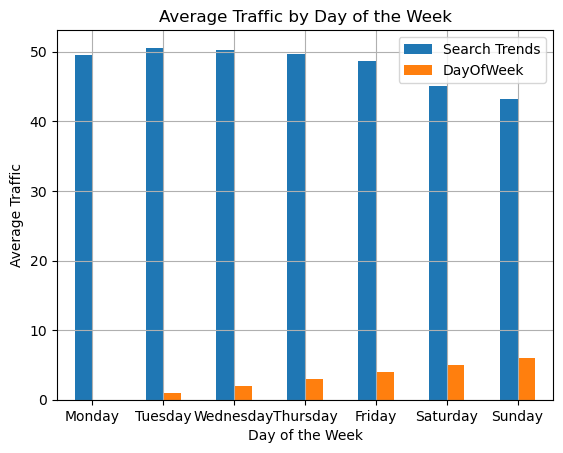

In [89]:
# Group the hourly search data to plot the average traffic by the day of week 

# Code To Extract day of the week from the DateTime index (Monday=0, Sunday=6)
df_mercado_trends['Day of Week'] = df_mercado_trends.index.dayofweek

# Code To Group by day of the week and calculate the mean traffic
average_traffic_by_day = df_mercado_trends.groupby('Day of Week').mean()

# Code To Create a mapping of day indices to day names for better readability in the plot
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
average_traffic_by_day.index = days

# Code To Plot the results
plt.figure(figsize=(10, 6))
average_traffic_by_day.plot(kind='bar')
plt.title('Average Traffic by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Average Traffic')
plt.xticks(rotation=0)  # Rotate x-axis labels for better readability
plt.grid(True)
plt.show()


#### Step 3: Group the hourly search data to plot the average traffic by the week of the year.

<Figure size 1500x700 with 0 Axes>

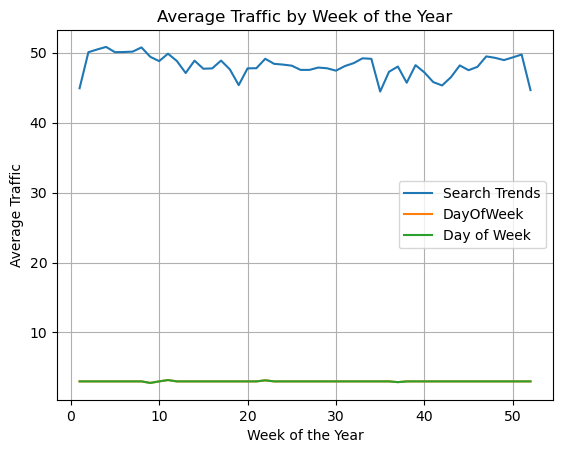

In [90]:
# Group the hourly search data to plot the average traffic by the week of the year 

# Extract week of the year from the DateTime index
df_mercado_trends['Week of Year'] = df_mercado_trends.index.isocalendar().week

# Group by week of the year and calculate the mean traffic
average_traffic_by_week = df_mercado_trends.groupby('Week of Year').mean()

# Plot the results
plt.figure(figsize=(15, 7))
average_traffic_by_week.plot()
plt.title('Average Traffic by Week of the Year')
plt.xlabel('Week of the Year')
plt.ylabel('Average Traffic')
plt.grid(True)
plt.show()



##### Answer the following question:

**Question:** Are there any time based trends that you can see in the data?

**Later in the year, search trends tend to be higher.** 

## Step 3: Relate the Search Traffic to Stock Price Patterns

You mention your work on the search traffic data during a meeting with people in the finance group at the company. They want to know if any relationship between the search data and the company stock price exists, and they ask if you can investigate.

To do so, complete the following steps:

1. Read in and plot the stock price data. Concatenate the stock price data to the search data in a single DataFrame.

2. Market events emerged during the year of 2020 that many companies found difficult. But, after the initial shock to global financial markets, new customers and revenue increased for e-commerce platforms. Slice the data to just the first half of 2020 (`2020-01` to `2020-06` in the DataFrame), and then plot the data. Do both time series indicate a common trend that’s consistent with this narrative?

3. Create a new column in the DataFrame named “Lagged Search Trends” that offsets, or shifts, the search traffic by one hour. Create two additional columns:

    * “Stock Volatility”, which holds an exponentially weighted four-hour rolling average of the company’s stock volatility

    * “Hourly Stock Return”, which holds the percent change of the company's stock price on an hourly basis

4. Review the time series correlation, and then answer the following question: Does a predictable relationship exist between the lagged search traffic and the stock volatility or between the lagged search traffic and the stock price returns?


#### Step 1: Read in and plot the stock price data. Concatenate the stock price data to the search data in a single DataFrame.

In [91]:
# Upload the "mercado_stock_price.csv" file into Colab, then store in a Pandas DataFrame
# Set the "date" column as the Datetime Index.
df_mercado_stock = pd.read_csv(
    "https://static.bc-edx.com/ai/ail-v-1-0/m8/lms/datasets/mercado_stock_price.csv",
    index_col="date",
    parse_dates=True, 
    infer_datetime_format=True
).dropna()

# View the first and last five rows of the DataFrame
display(df_mercado_stock.head())
display(df_mercado_stock.tail())

C:\Users\ismet\AppData\Local\Temp\ipykernel_7620\880024568.py:3: FutureWarning:

The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.



,close
date,
2015-01-02 09:00:00,127.67
2015-01-02 10:00:00,125.44
2015-01-02 11:00:00,125.57
2015-01-02 12:00:00,125.40
2015-01-02 13:00:00,125.17


,close
date,
2020-07-31 11:00:00,1105.780
2020-07-31 12:00:00,1087.925
2020-07-31 13:00:00,1095.800
2020-07-31 14:00:00,1110.650
2020-07-31 15:00:00,1122.510


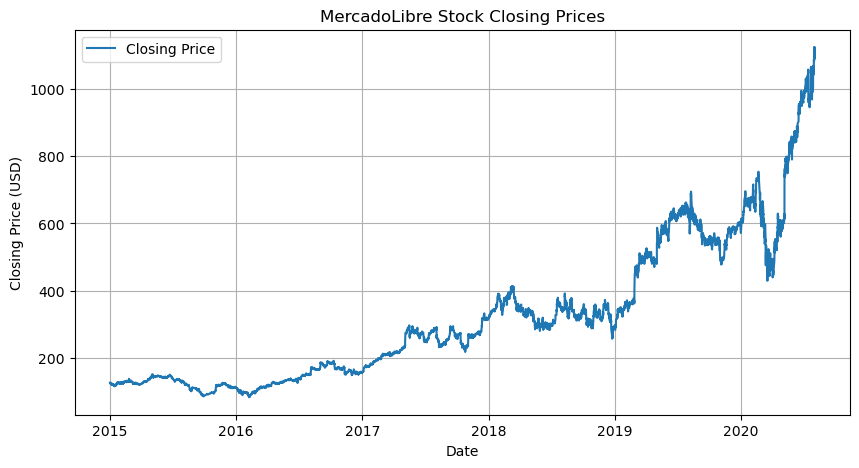

In [35]:
# Visualize the closing price of the df_mercado_stock DataFrame
plt.figure(figsize=(10, 5))  # Set the size of the figure
plt.plot(df_mercado_stock.index, df_mercado_stock['close'], label='Closing Price')  # Plot the closing price
plt.title('MercadoLibre Stock Closing Prices')  # Title of the plot
plt.xlabel('Date')  # X-axis label
plt.ylabel('Closing Price (USD)')  # Y-axis label
plt.legend()  # Add a legend
plt.grid(True)  # Show grid
plt.show()  # Display the plot


In [37]:
# Concatenate the df_mercado_stock DataFrame with the df_mercado_trends DataFrame
# Concatenate the DataFrame by columns (axis=1), and drop and rows with only one column of data
df_combined = pd.concat([df_mercado_stock, df_mercado_trends], axis=1).dropna()

# View the first and last five rows of the DataFrame
display(df_combined.head())
display(df_combined.tail())

,close,Search Trends,Week of Year
2016-06-01 09:00:00,135.16,6.0,22
2016-06-01 10:00:00,136.63,12.0,22
2016-06-01 11:00:00,136.56,22.0,22
2016-06-01 12:00:00,136.42,33.0,22
2016-06-01 13:00:00,136.10,40.0,22


,close,Search Trends,Week of Year
2020-07-31 11:00:00,1105.780,20.0,31
2020-07-31 12:00:00,1087.925,32.0,31
2020-07-31 13:00:00,1095.800,41.0,31
2020-07-31 14:00:00,1110.650,47.0,31
2020-07-31 15:00:00,1122.510,53.0,31


#### Step 2: Market events emerged during the year of 2020 that many companies found difficult. But, after the initial shock to global financial markets, new customers and revenue increased for e-commerce platforms. Slice the data to just the first half of 2020 (`2020-01` to `2020-06` in the DataFrame), and then plot the data. Do both time series indicate a common trend that’s consistent with this narrative?

In [39]:
# For the combined dataframe, slice to just the first half of 2020 (2020-01 through 2020-06) 
first_half_2020 = df_combined.loc['2020-01-01':'2020-06-30']

# View the first and last five rows of first_half_2020 DataFrame
display(first_half_2020.head())
display(first_half_2020.tail())

,close,Search Trends,Week of Year
2020-01-02 09:00:00,601.085,9.0,1
2020-01-02 10:00:00,601.290,14.0,1
2020-01-02 11:00:00,615.410,25.0,1
2020-01-02 12:00:00,611.400,37.0,1
2020-01-02 13:00:00,611.830,50.0,1


,close,Search Trends,Week of Year
2020-06-30 11:00:00,976.17,17.0,27
2020-06-30 12:00:00,977.50,27.0,27
2020-06-30 13:00:00,973.23,37.0,27
2020-06-30 14:00:00,976.50,45.0,27
2020-06-30 15:00:00,984.93,51.0,27


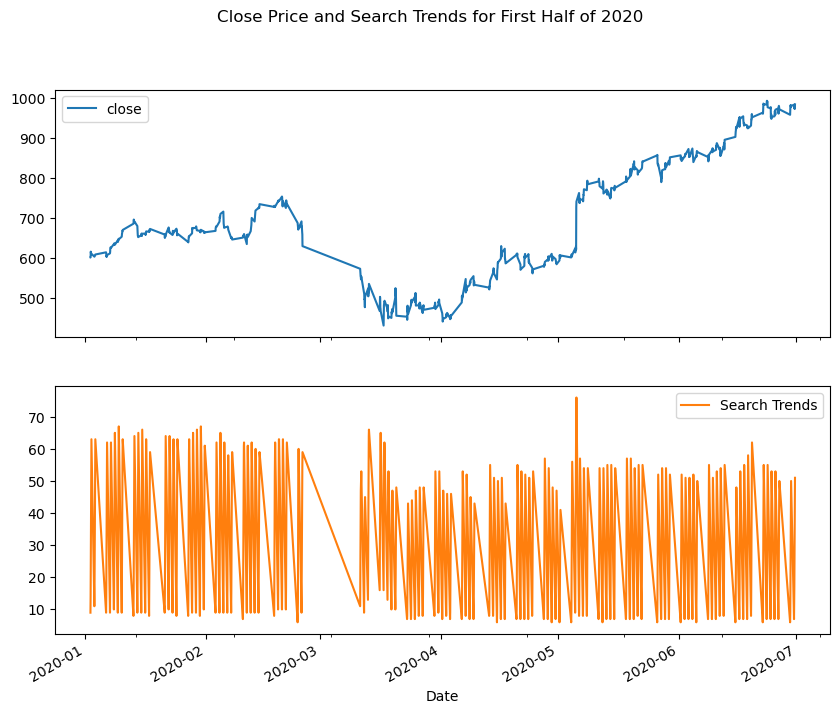

In [92]:
# Visualize the close and Search Trends data
# Plot each column on a separate axes using the following syntax
# `plot(subplots=True)`
ax = first_half_2020[['close', 'Search Trends']].plot(subplots=True, figsize=(10, 8), title='Close Price and Search Trends for First Half of 2020')
plt.xlabel('Date')  # Set common x-axis label
plt.show()

##### Answer the following question:

**Question:** Do both time series indicate a common trend that’s consistent with this narrative?

**Answer:** In truth, our evidence of a common trend between search activity and stock price is pretty limited. It does appear generally however that the low point for Mercado Libre's stock price, late March to early April, did coincide with lower search activity for the firm. Search activity does pick up along with its stock price, although the stock price from mid-April onward definitively outpaces search interest.

There's one important thing to note: if you zoom in both graphs to the spike around May 5th, 2020, you'll find the date of the company's earnings release to the public. It looks like search traffic for the firm spiked about two hours before the firm's stock price spiked. This could indicate a predictable pattern (can Google Searches predict the stock price?), but an alternative explanation might just be that people tend to search for more information about the firm right before an earnings announcement gets released. We'd need to do a little more time-series research to see which explanation best fits the data.

#### Step 3: Create a new column in the DataFrame named “Lagged Search Trends” that offsets, or shifts, the search traffic by one hour. Create two additional columns:

* “Stock Volatility”, which holds an exponentially weighted four-hour rolling average of the company’s stock volatility

* “Hourly Stock Return”, which holds the percent change of the company's stock price on an hourly basis


In [94]:
# Create a new column in the mercado_stock_trends_df DataFrame called Lagged Search Trends
# This column should shift the Search Trends information by one hour
df_combined['Lagged Search Trends'] = df_combined['Search Trends'].shift(1)

# Display the first few rows to verify the new column
print(df_combined[['Search Trends', 'Lagged Search Trends']].head())


                     Search Trends  Lagged Search Trends
2016-06-01 09:00:00            6.0                   NaN
2016-06-01 10:00:00           12.0                   6.0
2016-06-01 11:00:00           22.0                  12.0
2016-06-01 12:00:00           33.0                  22.0
2016-06-01 13:00:00           40.0                  33.0


In [95]:
# Create a new column in the mercado_stock_trends_df DataFrame called Stock Volatility
# This column should calculate the standard deviation of the closing stock price return data over a 4 period rolling window
import pandas as pd

# Calculate returns from the closing prices
df_combined['Returns'] = df_combined['close'].pct_change()

# Calculate rolling standard deviation of returns over a 4-period window
df_combined['Stock Volatility'] = df_combined['Returns'].rolling(window=4).std()

# Display the first few rows to verify the new column
print(df_combined[['close', 'Returns', 'Stock Volatility']].head())



                      close   Returns  Stock Volatility
2016-06-01 09:00:00  135.16       NaN               NaN
2016-06-01 10:00:00  136.63  0.010876               NaN
2016-06-01 11:00:00  136.56 -0.000512               NaN
2016-06-01 12:00:00  136.42 -0.001025               NaN
2016-06-01 13:00:00  136.10 -0.002346          0.006134


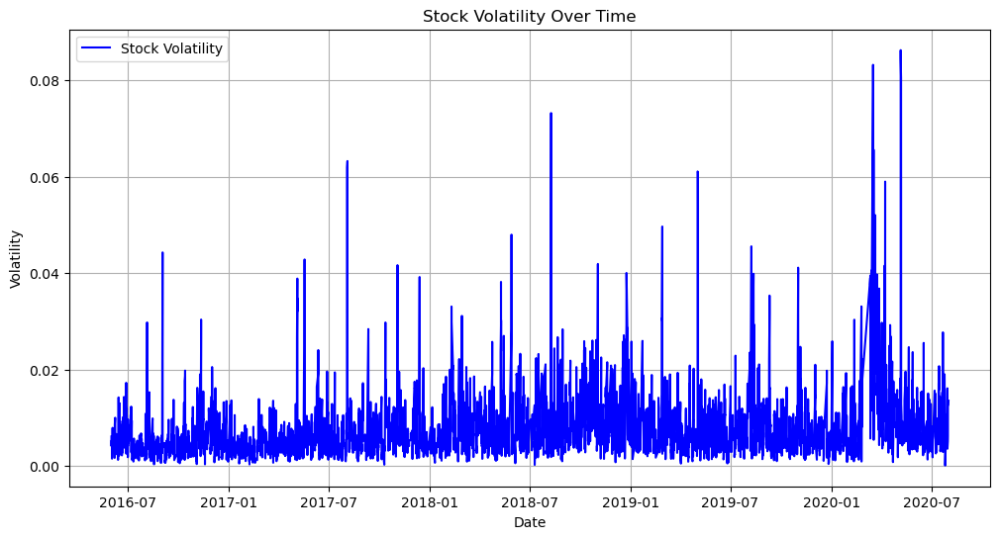

In [96]:
# Visualize the stock volatility
import matplotlib.pyplot as plt

# Assuming df_combined already has the 'Stock Volatility' column computed
# Plot the Stock Volatility
plt.figure(figsize=(12, 6))  # Set the figure size for better visibility
plt.plot(df_combined.index, df_combined['Stock Volatility'], label='Stock Volatility', color='blue')
plt.title('Stock Volatility Over Time')  # Title of the plot
plt.xlabel('Date')  # X-axis label
plt.ylabel('Volatility')  # Y-axis label
plt.legend()  # Add a legend
plt.grid(True)  # Show grid for better readability
plt.show()  # Display the plot



**Solution Note:** Note how volatility spiked, and tended to stay high, during the first half of 2020. This is a common characteristic of volatility in stock returns worldwide: high volatility days tend to be followed by yet more high volatility days. When it rains, it pours.

In [97]:
# Create a new column in the mercado_stock_trends_df DataFrame called Hourly Stock Return
# This column should calculate hourly return percentage of the closing price
# Calculate hourly return percentage of the closing price
df_combined['Hourly Stock Return'] = df_combined['close'].pct_change() * 100

# Display the first few rows to verify the new column
print(df_combined[['close', 'Hourly Stock Return']].head())



                      close  Hourly Stock Return
2016-06-01 09:00:00  135.16                  NaN
2016-06-01 10:00:00  136.63             1.087600
2016-06-01 11:00:00  136.56            -0.051233
2016-06-01 12:00:00  136.42            -0.102519
2016-06-01 13:00:00  136.10            -0.234570


In [98]:
# View the first and last five rows of the mercado_stock_trends_df DataFrame
# View the first five rows
print("First five rows:")
print(df_combined.head())

# View the last five rows
print("Last five rows:")
print(df_combined.tail())


First five rows:
                      close  Search Trends  Week of Year  \
2016-06-01 09:00:00  135.16            6.0            22   
2016-06-01 10:00:00  136.63           12.0            22   
2016-06-01 11:00:00  136.56           22.0            22   
2016-06-01 12:00:00  136.42           33.0            22   
2016-06-01 13:00:00  136.10           40.0            22   

                     Lagged Search Trends   Returns  Stock Volatility  \
2016-06-01 09:00:00                   NaN       NaN               NaN   
2016-06-01 10:00:00                   6.0  0.010876               NaN   
2016-06-01 11:00:00                  12.0 -0.000512               NaN   
2016-06-01 12:00:00                  22.0 -0.001025               NaN   
2016-06-01 13:00:00                  33.0 -0.002346          0.006134   

                     Hourly Stock Return  
2016-06-01 09:00:00                  NaN  
2016-06-01 10:00:00             1.087600  
2016-06-01 11:00:00            -0.051233  
2016-06-01 

#### Step 4: Review the time series correlation, and then answer the following question: Does a predictable relationship exist between the lagged search traffic and the stock volatility or between the lagged search traffic and the stock price returns?

In [99]:
# Construct correlation table of Stock Volatility, Lagged Search Trends, and Hourly Stock Return
# 'Lagged Search Trends', and 'Hourly Stock Return' columns
# Calculate the correlation matrix for the selected columns
correlation_table = df_combined[['Stock Volatility', 'Lagged Search Trends', 'Hourly Stock Return']].corr()

# Display the correlation table
print(correlation_table)


                      Stock Volatility  Lagged Search Trends  \
Stock Volatility              1.000000             -0.148938   
Lagged Search Trends         -0.148938              1.000000   
Hourly Stock Return           0.061424              0.017929   

                      Hourly Stock Return  
Stock Volatility                 0.061424  
Lagged Search Trends             0.017929  
Hourly Stock Return              1.000000  


##### Answer the following question:


**Question:** Does a predictable relationship exist between the lagged search traffic and the stock volatility or between the lagged search traffic and the stock price returns?

**Answer:** If we read down the second column (or read along the second row), we see that there's a slight negative correlation between searches for the firm and its subsequent stock volatility. More searches (slightly) tend to indicate less near-term hourly stock risk for the firm.

On the other hand, there's a positive correlation between search activity in one hour and stock returns in the next: as search activity goes up, so will the firm's stock price in the short term. This effect is very weak though, only half the size of the effect on stock volatility. With the correlation so close to zero, some might also say that there's almost no relationship between these two variables whatsoever, and that the small findings that we do have could be just due to chance. While there's no required threshold when looking at correlation between stock returns and the variables used to predict them, it does tend to be that correlations in this context tend to be very low across the board. It's hard to predict the market!

## Step 4: Create a Time Series Model with Prophet

Now, you need to produce a time series model that analyzes and forecasts patterns in the hourly search data. To do so, complete the following steps:

1. Set up the Google search data for a Prophet forecasting model.

2. After estimating the model, plot the forecast. How's the near-term forecast for the popularity of MercadoLibre?

3. Plot the individual time series components of the model to answer the following questions:

    * What time of day exhibits the greatest popularity?

    * Which day of the week gets the most search traffic?

    * What's the lowest point for search traffic in the calendar year?


#### Step 1: Set up the Google search data for a Prophet forecasting model.

In [100]:
# Using the df_mercado_trends DataFrame, reset the index so the date information is no longer the index


# Label the columns ds and y so that the syntax is recognized by Prophet


# Drop an NaN values from the prophet_df DataFrame


# View the first and last five rows of the mercado_prophet_df DataFrame

prophet_df = df_mercado_trends.reset_index()

# Display current column names to understand what they are
print("Current column names:", prophet_df.columns)

# Replace 'Search Trends' with the actual column name you want to use for 'y'
# and adjust other column names as needed
prophet_df = prophet_df[['Date', 'Search Trends']]  # Adjust this line to only include columns you need
prophet_df.columns = ['ds', 'y']

# Drop any NaN values
prophet_df = prophet_df.dropna()

# View the first and last five rows of the DataFrame
print("First five rows:")
print(prophet_df.head())
print("Last five rows:")
print(prophet_df.tail())



Current column names: Index(['Date', 'Search Trends', 'DayOfWeek', 'Day of Week', 'Week of Year'], dtype='object')
First five rows:
                   ds   y
0 2016-06-01 00:00:00  97
1 2016-06-01 01:00:00  92
2 2016-06-01 02:00:00  76
3 2016-06-01 03:00:00  60
4 2016-06-01 04:00:00  38
Last five rows:
                       ds   y
37101 2020-09-07 20:00:00  71
37102 2020-09-07 21:00:00  83
37103 2020-09-07 22:00:00  96
37104 2020-09-07 23:00:00  97
37105 2020-09-08 00:00:00  96


In [101]:
# Call the Prophet function, store as an object
from prophet import Prophet

# Create a Prophet object
model = Prophet()
# Assuming 'prophet_df' is your DataFrame prepared for Prophet
model.fit(prophet_df)



13:36:40 - cmdstanpy - INFO - Chain [1] start processing
13:37:02 - cmdstanpy - INFO - Chain [1] done processing


In [60]:
# Fit the time-series model.
# Create a DataFrame to hold future dates for which predictions are needed
future = model.make_future_dataframe(periods=365)  # Adjust the 'periods' as necessary

# Use the model to make predictions
forecast = model.predict(future)

# Show the forecast
print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail())



              ds       yhat  yhat_lower  yhat_upper
37466 2021-09-04  79.075184   65.873002   93.063576
37467 2021-09-05  73.861161   58.820575   88.454230
37468 2021-09-06  75.815265   61.205484   90.226946
37469 2021-09-07  82.194877   68.015640   96.345871
37470 2021-09-08  80.744805   65.391536   94.811076


In [62]:
# Create a future dataframe to hold predictions
# Make the prediction go out as far as 2000 hours (approx 80 days)


# View the last five rows of the future_mercado_trends DataFrame

from prophet import Prophet

# Assuming the Prophet model is already created and named 'model'
# Create a future DataFrame that extends 2000 hours beyond the last date in the original data
future_mercado_trends = model.make_future_dataframe(periods=2000, freq='H')

# Print the last five rows of the future_mercado_trends DataFrame
print(future_mercado_trends.tail())

# Predict the future with the model
forecast_mercado_trends = model.predict(future_mercado_trends)

# View the last five rows of the forecast output
print(forecast_mercado_trends[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail())





                       ds
39101 2020-11-30 04:00:00
39102 2020-11-30 05:00:00
39103 2020-11-30 06:00:00
39104 2020-11-30 07:00:00
39105 2020-11-30 08:00:00
                       ds       yhat  yhat_lower  yhat_upper
39101 2020-11-30 04:00:00  39.507473   30.375529   47.765528
39102 2020-11-30 05:00:00  24.036286   15.092963   32.279333
39103 2020-11-30 06:00:00  12.070566    3.537519   20.187057
39104 2020-11-30 07:00:00   4.798365   -3.660798   13.672592
39105 2020-11-30 08:00:00   2.603438   -6.068937   10.730617


In [65]:
# Assuming the Prophet model is already created and named 'model'
# Predict the future with the model using the future_mercado_trends DataFrame
forecast_mercado_trends = model.predict(future_mercado_trends)

# Display the first five rows of the forecast output
print(forecast_mercado_trends[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head())


                   ds       yhat  yhat_lower  yhat_upper
0 2016-06-01 00:00:00  89.659992   81.295387   97.727414
1 2016-06-01 01:00:00  86.106654   78.185783   94.402325
2 2016-06-01 02:00:00  75.784037   67.895357   84.372000
3 2016-06-01 03:00:00  60.517701   51.888181   69.435626
4 2016-06-01 04:00:00  43.403713   35.382515   52.383326


In [64]:
# Make the predictions for the trend data using the future_mercado_trends DataFrame


# Display the first five rows of the forecast_mercado_trends DataFrame


#### Step 2: After estimating the model, plot the forecast. How's the near-term forecast for the popularity of MercadoLibre?

In [68]:
# Plot the Prophet predictions for the Mercado trends data

from prophet.plot import plot_plotly, plot_components_plotly
import plotly.offline as py

# Assuming the Prophet model is already created and named 'model'
fig = plot_plotly(model, forecast_mercado_trends)
py.iplot(fig)

# Plot the components of the forecast
components_fig = plot_components_plotly(model, forecast_mercado_trends)
py.iplot(components_fig)




c:\Users\ismet\New_Anaconda\anaconda3\envs\dev_mete\lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



c:\Users\ismet\New_Anaconda\anaconda3\envs\dev_mete\lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\ismet\New_Anaconda\anaconda3\envs\dev_mete\lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\ismet\New_Anaconda\anaconda3\envs\dev_mete\lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain

##### Answer the following question:

**Question:**  How's the near-term forecast for the popularity of MercadoLibre?

**Answer:** 


#### Step 3: Plot the individual time series components of the model to answer the following questions:

* What time of day exhibits the greatest popularity?

* Which day of the week gets the most search traffic?

* What's the lowest point for search traffic in the calendar year?


In [70]:
# Set the index in the forecast_mercado_trends DataFrame to the ds datetime column


# View the only the yhat,yhat_lower and yhat_upper columns from the DataFrame

# Set the 'ds' column as the index of the DataFrame
forecast_mercado_trends.set_index('ds', inplace=True)


# Display the forecast columns 'yhat', 'yhat_lower', and 'yhat_upper'
print(forecast_mercado_trends[['yhat', 'yhat_lower', 'yhat_upper']].head())




                          yhat  yhat_lower  yhat_upper
ds                                                    
2016-06-01 00:00:00  89.659992   81.295387   97.727414
2016-06-01 01:00:00  86.106654   78.185783   94.402325
2016-06-01 02:00:00  75.784037   67.895357   84.372000
2016-06-01 03:00:00  60.517701   51.888181   69.435626
2016-06-01 04:00:00  43.403713   35.382515   52.383326


Solutions Note: `yhat` represents the most likely (average) forecast, whereas `yhat_lower` and `yhat_upper` represents the worst and best case prediction (based on what are known as 95% confidence intervals).

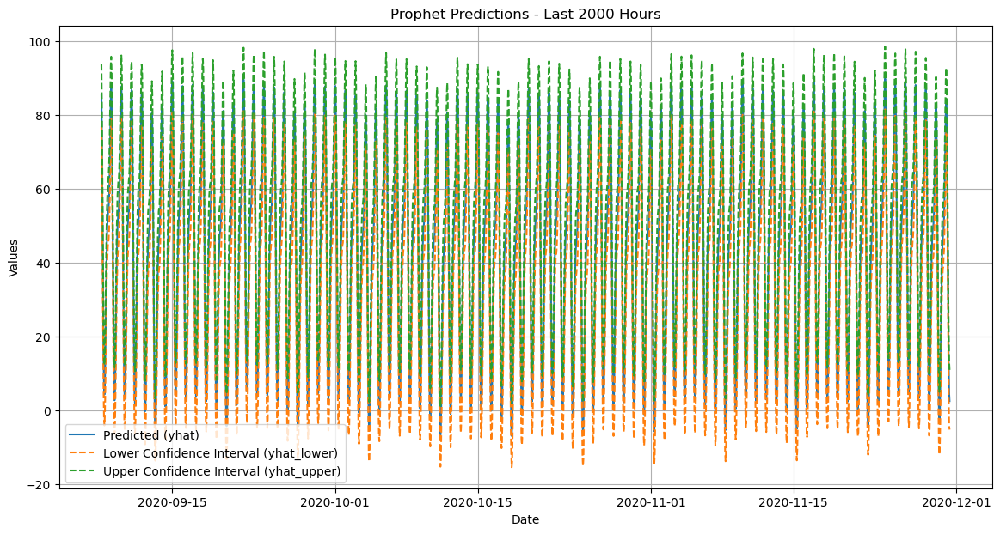

In [73]:
# From the forecast_mercado_trends DataFrame, plot the data to visualize
#  the yhat, yhat_lower, and yhat_upper columns over the last 2000 hours 
import matplotlib.pyplot as plt

# Assuming the index is already set to 'ds' which is the datetime
# Select the last 2000 hours
last_2000_hours = forecast_mercado_trends.iloc[-2000:]

# Create the plot
plt.figure(figsize=(14, 7))  # Set the size of the plot

# Plot each column
plt.plot(last_2000_hours.index, last_2000_hours['yhat'], label='Predicted (yhat)')
plt.plot(last_2000_hours.index, last_2000_hours['yhat_lower'], label='Lower Confidence Interval (yhat_lower)', linestyle='--')
plt.plot(last_2000_hours.index, last_2000_hours['yhat_upper'], label='Upper Confidence Interval (yhat_upper)', linestyle='--')

# Adding labels and title
plt.title('Prophet Predictions - Last 2000 Hours')
plt.xlabel('Date')
plt.ylabel('Values')
plt.legend()

# Show grid
plt.grid(True)

# Display the plot
plt.show()




c:\Users\ismet\New_Anaconda\anaconda3\envs\dev_mete\lib\site-packages\prophet\plot.py:228: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\ismet\New_Anaconda\anaconda3\envs\dev_mete\lib\site-packages\prophet\plot.py:397: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

c:\Users\ismet\New_Anaconda\anaconda3\envs\dev_mete\lib\site-packages\prophet\plot.py:401: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

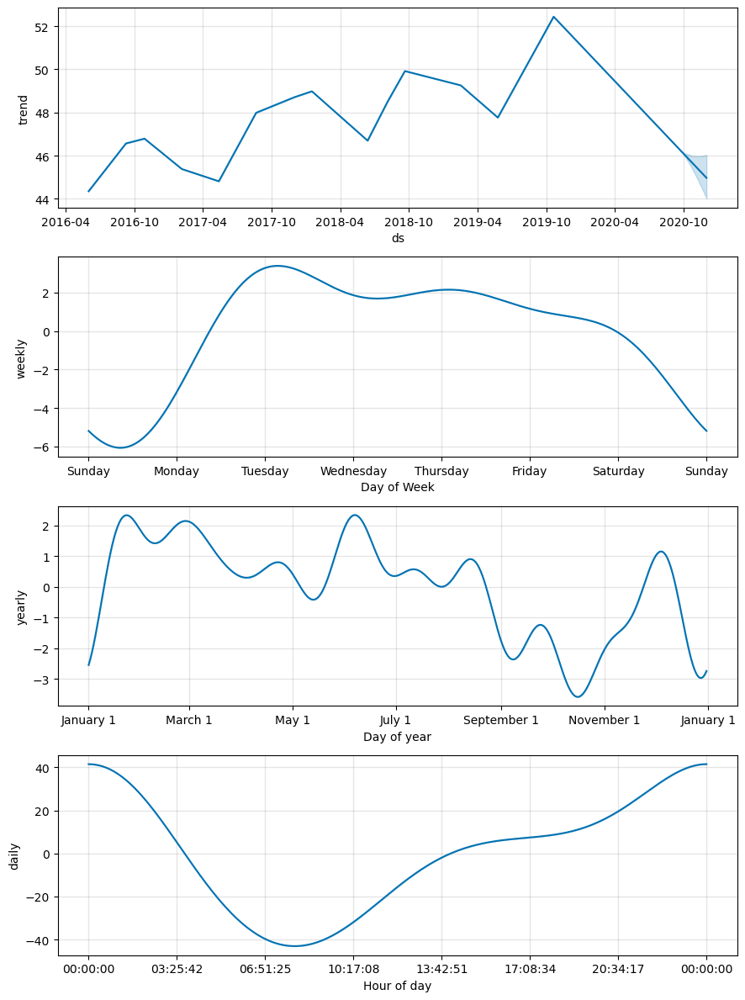

In [74]:
# Reset the index in the forecast_mercado_trends DataFrame


# Use the plot_components function to visualize the forecast results 
# for the forecast_canada DataFrame 

# Reset the index to make 'ds' a regular column again
forecast_mercado_trends.reset_index(inplace=True)


from prophet.plot import plot_components

fig_components = plot_components(model, forecast_mercado_trends)

# Display the components plot
fig_components.show()


##### Answer the following questions:

**Question:** What time of day exhibits the greatest popularity?

**Midnight:** 

**Question:** Which day of week gets the most search traffic? 
   
**Tuesday:** 

**Question:** What's the lowest point for search traffic in the calendar year?

**November:** 
